### goal 7/5 9am-1pm :  company names = match with = parent compay —> get a string match 


In [3]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib
from matplotlib import pyplot as plt
pd.set_option('display.max_columns',None)
import seaborn as sns
from shapely.geometry import Point, Polygon
import math
import plotly.express as px
from thefuzz import fuzz
from thefuzz import process

## ------------------------------------------ ##

In [4]:
#reading in the dataset
path = "../../rafi_data/2022_Business_Academic_QCQ_grocery.csv"
# data hosted on box: https://uchicago.box.com/s/yepla37ch7s7mismml8ftda0b7nqjk8m
# This data was filtered by Todd to include all grocery stores in 2022
stores_2022 = pd.read_csv(path)

stores_2022.drop(['Unnamed: 0'],inplace=True,axis=1)
territories = ['PR', 'FM', 'MP', 'GU', 'VI', 'MH']
stores_2022 = stores_2022.drop(stores_2022[stores_2022['STATE'].isin(territories)].index)
stores_2022.head()

,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,LOCATION SALES VOLUME CODE,PRIMARY SIC CODE,SIC6_DESCRIPTIONS,PRIMARY NAICS CODE,NAICS8 DESCRIPTIONS,SIC CODE,SIC6_DESCRIPTIONS (SIC),SIC CODE 1,SIC6_DESCRIPTIONS (SIC1),SIC CODE 2,SIC6_DESCRIPTIONS(SIC2),SIC CODE 3,SIC6_DESCRIPTIONS(SIC3),SIC CODE 4,SIC6_DESCRIPTIONS(SIC4),ARCHIVE VERSION YEAR,YELLOW PAGE CODE,EMPLOYEE SIZE (5) - LOCATION,SALES VOLUME (9) - LOCATION,BUSINESS STATUS CODE,INDUSTRY SPECIFIC FIRST BYTE,YEAR ESTABLISHED,OFFICE SIZE CODE,COMPANY HOLDING STATUS,ABI,SUBSIDIARY NUMBER,PARENT NUMBER,PARENT ACTUAL EMPLOYEE SIZE,PARENT ACTUAL SALES VOLUME,PARENT EMPLOYEE SIZE CODE,PARENT SALES VOLUME CODE,SITE NUMBER,ADDRESS TYPE INDICATOR,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE
0,GOMART,55 POSTAL PLZ,MORGANTOWN,WV,26508,7005.0,61.0,304,2,C,C,541103,CONVENIENCE STORES,44512001.0,CONVENIENCE STORES,554101.0,SERVICE STATIONS-GASOLINE & OIL,554110.0,ALTERNATIVE FUELS,NaN,NaN,NaN,NaN,NaN,NaN,2022,21303.0,13.0,2482.0,2,NaN,NaN,NaN,NaN,998372387,NaN,124929449.0,50.0,389500.0,E,I,998372387.0,NaN,7,11000.0,3.0,39.594376,-79.954437,P,34060.0,2.0,390.0,54061.0
1,7-ELEVEN,485 E MAIN ST,EL CENTRO,CA,92243,2619.0,25.0,760,2,B,C,541103,CONVENIENCE STORES,44512001.0,CONVENIENCE STORES,554101.0,SERVICE STATIONS-GASOLINE & OIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,NaN,6.0,1273.0,2,W,NaN,NaN,NaN,495660326,NaN,5863311.0,800.0,1272634.0,H,K,495660326.0,NaN,7,11400.0,3.0,32.792679,-115.536058,0,20940.0,2.0,0.0,6025.0
2,EL SOL MARKET,110 W MAIN ST,WESTMORLAND,CA,92281,NaN,25.0,760,2,B,C,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,5.0,1061.0,9,NaN,NaN,NaN,NaN,519605455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,10200.0,1.0,33.051800,-115.581800,X,20940.0,2.0,0.0,6025.0
3,COOL SPRINGS GROCERY,241 WILDWOOD ST,MORGANTOWN,WV,26505,3141.0,61.0,304,2,A,A,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,2.0,382.0,9,NaN,NaN,NaN,NaN,817953730,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,10400.0,4.0,39.652885,-79.986398,P,34060.0,2.0,390.0,54061.0
4,CIRCLE K,123 E MAIN ST,WESTMORLAND,CA,92281,NaN,25.0,760,2,B,C,541103,CONVENIENCE STORES,44512001.0,CONVENIENCE STORES,554101.0,SERVICE STATIONS-GASOLINE & OIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,NaN,6.0,1273.0,2,F,NaN,NaN,NaN,855113817,NaN,450720289.0,650.0,4981020.0,H,J,NaN,NaN,3,10200.0,1.0,33.051800,-115.581800,X,20940.0,2.0,0.0,6025.0


In [5]:
#grocery_sic['COMPANY'] = grocery_sic['COMPANY'].apply(lambda x: x.split()[0])

#grocery_sic['Parent Company ASC'] = 'Walmart Co '
#grocery_sic

testone = ['Ahold Delhaize'] 
input_list= stores_2022['COMPANY']

matches = [] 
for item in testone: 
    for result in process.extract(item,input_list,limit=10):
        store = result [0]
        score = result [1]
        if score >= 77 and store not in matches: 
            matches.append(store)
            
print (matches) 

# Walmart = 'WALMART GROCERY PICKUP', 'WALMART GROCERY PKUP-DELIVERY'
# costco = COSTCO DELI
# kroger = KROGER
# Ahold Delhaize = 'AHOLD DELHAIZE USA', 'AHOLD', 'EL', 
# ,'AHOLD DELHAIZE USA INC', 'A & A', 'H & H', 'STOP-SHOP AHOLD AIS GIANT L', 'L & L', 'AHOLD USA'

['AHOLD DELHAIZE USA', 'AHOLD', 'EL', 'AHOLD DELHAIZE USA INC', 'A & A', 'H & H', 'STOP-SHOP AHOLD AIS GIANT L', 'L & L', 'AHOLD USA']


In [6]:
stores_2022['COMPANY'] = stores_2022['COMPANY'].apply(lambda x: x.split()[0])

stores_2022['Parent Company ASC'] = 'Walmart Co'

AttributeError: 'float' object has no attribute 'split'

In [10]:
# Define the names to filter
walmart_affiliated = ['Asda','Jet','Massmart','Bare necessities',
'Vudu','Equate','Moosejaw','Eloquii','ModCloth','Flipkart','Sams Club','Parcel']

# Build a dictionary to store the filtered names and their corresponding data
filtered_data = {}
for index, company  in df.iterrows():
    if company['Name'] in desired_names:
        filtered_data[row['Name']] = {'Age': row['Age'], 'City': row['City']}

# Create an updated DataFrame from the filtered dictionary
updated_df = pd.DataFrame.from_dict(filtered_data, orient='index')

print(updated_df)


# albertsons = [
"Acme Markets",
"Albertsons",
"Albertsons Market",
"Amigos",
"Andronico's",
"Balducci's",
"Carrs",
"Haggen",
"Jewel-Osco",
"Kings Food Markets",
"Lucky",
"Market Street",
"Pak 'n Save",
"Pavilions",
"Randalls"
"Safewa",
"Shaw's",
"Star Market",
"Tom Thumb",
"United Supermarkets",
"Vons",
"Buttrey Food and Drug",
"Max Food and Drug",
"Max Foods",
"Skagg's Albertsons"
"Super Saver"
]

#Kroger = [
"Baker's",
"City Market",
"Dillons",
"Food 4 Less",
"Foods Co.",
"Fred Meyer",
"Fry's",
"Gerbes",
"Harris Teeter",
"JayC",
"King Soopers",
"Kroger",
"Mariano's",
"Metro Market",
"Pay Less",
"Pick 'n Save",
"QFC",
"Ralphs",
"Ruler Foods",
"Smith's"
]








SyntaxError: unmatched ']' (2280427286.py, line 44)

In [ ]:
# Albertsons owned supermarkets/companies
albertsons= ["Acme Markets",
    "Albertsons",
    "Albertsons Market",
    "Amigos",
    "Andronico's",
    "Balducci's",
    "Carrs",
    "Haggen",
    "Jewel-Osco",
    "Kings Food Markets",
    "Lucky",
    "Market Street",
    "Pak 'n Save",
    "Pavilions",
    "Randalls",
    "Safewa",
    "Shaw's",
    "Star Market",
    "Tom Thumb",
    "United Supermarkets",
    "Vons",
    "Buttrey Food and Drug",
    "Max Food and Drug",
    "Max Foods",
    "Skagg's Albertsons",
    "Super Saver",] 
parent = albertsons
companies = stores_2022["COMPANY"]
matches = []
for item in parent:
    for result in process.extract(item, companies, limit=len(parent)):
        store = result[0]
        score = result[1]
        if score >= 77 and store not in matches:
            matches.append(store)
print(matches)

In [ ]:
'ACME MARKETS', 
'ALBERTSONS', 
'ALBERTSONS MARKET', 
'2 AMIGOS',  
'AMIGOS UNITED', 
'LOS AMIGOS MARKET', 
'LOS AMIGOS SUPERMARKET', 
"ANDRONICO'S COMMUNITY MARKETS",
'CARRS/SAFEWAY', 
'CARRS SAFEWAY', 
'HAGGEN',
'HAGGEN FOOD & PHARMACY', 
'HAGGEN FOOD',
'JEWEL-OSCO', 
'KINGS FOOD MARKETS',
'KINGS FOOD MARKET', 
'MARKET STREET',
"PAK 'N SAVE", 
'PAVILIONS', 
'RANDALLS', 
'SAFEWAY', 
'STAR MARKET', 
'TOM THUMB', 
'UNITED SUPERMARKETS', 
'VONS', 
'MAX FOODS', 
'MAXI FOODS',
'SUPER SAVER',
'SUPER SAVE',  
'SUPER SAVER COST PLUS',
'CARRS QUALITY CTR PALMER SHPG'
 "SAAR'S SUPER SAVER FOODS"




In [ ]:
stores_2022.loc[stores_2022['COMPANY'] == "AMIGOS MKT LOS"]

In [3]:
#Generated String Matches from above

#String matched brands owned by Walmart:
walmart_string = ['WALMART GROCERY PICKUP', 'WALMART GROCERY PKUP-DELIVERY', "SAM'S CLUB DELI"]

#String matched brands owned by Ahold Delhaize:
ahold_string = ['BOTTOM DOLLAR', 'DOLLAR DOLLAR', 'FOOD', 'FOOD 4 LESS', 'FOOD LION', 'FRESH DIRECT', 'REC', 'FRESH', 'H & H', 'S & S', 'FRESHII', 'GIANT', 'GIANT EAGLE', 'GIANT EAGLE FLORAL', 'GIANT FOOD', 'HANNAFORD', 'STOP & SHOP', 'PEA POD', 'BFRESH MARKET', 'REFRESH', 'EASTSIDE MARKETPLACE', 'WESTSIDE MARKETPLACE', 'MARKET', 'E MARKET', 'MARKETPLACE']

#String matched brands owned by Kroger:
kroger_string = ["BAKER'S", 'S & S', 'BAKERS', "BAKER'S GAS & WELD SUPLS INC", "BAKER'S GAS", "BAKER'S MARKET", "BAKER'S PRO FARM LLC", 'BAKER STREET MARKET', "BAKER'S KWIK SHOP", 'CITY MARKET', 'DILLONS', 'FOOD 4 LESS', 'FOODS CO', 'FRED MEYER', "FRY'S FOOD", 'GERBES SUPER MARKET', 'GERBES SUPER MARKETS', 'GE', 'GERBES SUPERMARKET', 'HARRIS TEETER', 'JAYC', "JAYCEE'S", 'JAYCON', 'CITY-RALEIGH-JAYCEE PARK-CMNTY', 'JAYCE MINIMARKET', 'NAY & JAY', 'KING SOOPERS', 'KROGER', "MARIANO'S", 'METRO MARKET', 'METRO MINI MARKET', 'MARKET MARKET', 'PAY LESS LIQUORS', 'PAY LESS SUPER MARKETS', 'PAY LESS GAS & FOOD', 'PAY LESS IGA', 'FOOD FOR LESS', 'FAR LESS FOOD MARKET', 'MORE FOR LESS', 'PRICE LESS FOODS', 'COST LESS FOODS CO', "PICK'N SAVE", 'QFC', 'RALPHS', 'RULER FOODS', "SMITH'S"]

#String matched brands owned by Costco
costco_string = ["COSTCO DELI"]

#String matched brands owned by Albertsons
albertsons_string = ['ACME MARKETS', 'ALBERTSONS', 'ALBERTSONS MARKET', 'MARKET MARKET', 'MARKET', '2 AMIGOS', 'AMIGO', 'LOS AMIGOS DISTRIBUTING', 'DOS AMIGOS MARKET', '3 AMIGOS BEER WINE-FOOD STORE', 'THREE AMIGOS', 'AMIGOS FOOD MART', 'LOS AMIGOS', 'AMIGOS MKT LOS', 'AMIGOS MARKET 7', 'TIENDA LOS AMIGOS', 'AMIGOS CONVENIENCE STORE', 'LOS AMIGOS UNO', 'AMIGOS LATIN GROCERY', 'AMIGOS UNITED', 'AMIGOS FOOD MART LLC', 'LOS AMIGOS MARKET', 'LOS AMIGOS SUPERMARKET', 'ICO', "ANDRONICO'S COMMUNITY MARKETS", "KRAUSZER'S FOOD STORE", "CASEY'S", "MR T'S", "SEVEN'S", "PATTY'S PANTRY & DELI", "CASHION'S QUIK STOP", 'E C F S SNACKS LLC', "MICKEY'S T-MART INC", "STATLER'S COUNTRY MART", "MIKE'S CONVENIENCE", "BELL'S ROWLESBURG GROCERY", "SOCCORSI'S GROCERY & SUBS", 'CC', "BALDUCCI'S FOOD LOVER'S MARKET", "DANIEL'S MARKET", "GRILLO'S MARKET", 'S & G CONVENIENCE MART', "NANCY'S FOODMART", "MILLER'S MARKETS", "MAYNARD'S OF FLANDREAU", "SKIP'S", "HARDESTY'S EXPRESS MART LLC", "KASSAR'S FOOD & GIFTS", "JERRY'S MARKET & LIQUOR", "SHELLY'S GROCERY & BAKERY LLC", 'CARRS/SAFEWAY', 'CARRS SAFEWAY', 'CARRS QUALITY CTR PALMER SHPG', 'BIG CHEAP CASH & CARR', 'C & B USED CARS', 'HAGGEN', 'HAGGEN FOOD & PHARMACY', 'HAGGEN SUPPORT CTR', 'HAGGEN FOOD', 'GE', 'JEWEL-OSCO', 'KINGS FOOD MARKETS', 'KINGS FOOD MARKET', "KING'S FOOD MARKET", "KING'S FOODMARKET", 'KINGS FOOD MART', 'FOOD', 'LUCKY', 'LUCKY 3', 'LUCKY 7', "LUCKY'S", 'LUCKY 8', 'LUCKYS', 'LUCKY SEVEN FOOD STORE', 'LUCKY FOOD FARMERS MARKET', 'LUCKY GROCERY & DELI', 'LUCKY DOLLAR', 'LUCKY CHARM CONVENIENCE STORE', 'LUCKY STAR MARKET LLC', 'LUCKY FOOD MART LLC', 'LUCKY MARKET', "LUCKY'S STATION", 'LUCKY MARKET LLC', "LUCKY'S SUPER MARKET", 'MARKET STREET', "PAK 'N SAVE", 'U-SAVE FOOD STORE', 'GOLD LINE GRAB N GO', 'INDO PAK SUPERMARKET', 'STOP N GO FOOD MART', 'STOP N GO ENTERPRISES INC', "OCALA SHOP N' PLAY LLC", 'J & N MINI MART 2', "GRAB 'N GO MART LLC", 'KWIK PAK FOOD MART', "SHOP 'N SAVE EXPRESS", 'PIC-N-SAVE MARKET', 'U-SAVE TRAVEL PLAZA', "UP NORT' SWEET N SAVORY", 'STOP N SHOP WESTFIELD', "SACK 'N SAVE FOOD", "STOP 'N GO MARKETS OF TEXAS", 'CARTA N SHORE GARAGE', 'MASALA INDO PAK GROCERS', 'IN N OUT FOOD & GAS LLC', "GAS 'N' GO FOOD & BEVERAGE", 'N A M C COMMUNITY MARKET INC', 'PAVILIONS', 'RANDALLS', 'SAFEWAY', 'S & S', "SHAW'S SUPERMARKET", "SHAW'S SUPERMARKETS INC", 'STAR MARKET', 'TOM THUMB', 'UNITED SUPERMARKETS', 'VONS', 'FOOD 4 LESS', 'FOOD MART', 'FOOD LION', 'HERA FOOD MART', 'FOOD TOWN', 'FOOD FAIR', 'OHM FOOD MART', "D'S FOOD STORE", 'FOOD EXPRESS', 'E Z FOOD MART', 'JR FOOD MART', 'EXPRESS FOOD', 'MR FOOD MART', 'CITGO CONVENIENT FOOD MART', 'GREEN ACRES HEALTH FOOD STORE', 'FRIENDSHIP FOOD STORES INC', 'VERISTAS AFRICAN FOOD STORE', 'ILLINOIS VALLEY FOOD & DELI', "FRY'S FOOD", 'FOOD CITY', 'MAX FOODS', 'MAXI FOODS', 'FOODS', 'FOOD MAX', 'SUPER ONE FOODS', 'SUNSHINE FOODS', 'JAMBOREE FOODS', 'DAY STAR FOODS', "SULLIVAN'S FOODS", 'AFFILIATED FOODS CO-OP', "JENSEN'S FINEST FOODS", 'EAST DAKOTAH NATURAL FOODS', "JENSEN'S FOODS", 'RITE PRICE FOODS', 'VALLEY CENTER FOODS', 'SUPER SAVER', 'SUPER SAVE', 'SUPER SAVER INC', 'SUPER', 'SUPER SAVER COST PLUS', "SAAR'S SUPER SAVER FOODS"]

In [4]:
#Cleaned lists from the string matches of supermarkets/companies actually owned by the parent coprporation
#***NOTE***There will be a margin of error from this process because stores were validated through manual checks
#***NOTE***It was unrealistic to manually inspect every store generated this way so there will be supermarkets/companies that do not actually belong to the parent coporation

#KROGERS FINAL
kroger_clean = ["BAKER'S",
 'BAKERS', 
 'CITY MARKET',
 'DILLONS',
 'FOOD 4 LESS', 
 'FOODS CO', 
 'FRED MEYER', 
 "FRY'S FOOD",
 'GERBES SUPER MARKET',  
 'GERBES SUPER MARKETS', 
 'GERBES SUPERMARKET', 
 'HARRIS TEETER', 
 'JAYC', 
 'KING SOOPERS',
 'KROGER',
 "MARIANO'S",
 'METRO MARKET', 
 'PAY LESS SUPER MARKETS',
 "PICK'N SAVE", 
 'QFC', 
 'RALPHS', 
 'RULER FOODS', 
 "SMITH'S"]

#Ahold Delhaize FINAL:
ahold_clean = ['BOTTOM DOLLAR',
 'FOOD LION',
 'GIANT',
 'GIANT EAGLE',
 'GIANT FOOD',
 'HANNAFORD',
 'STOP & SHOP',
 'PEA POD',
 'BFRESH MARKET',
 'EASTSIDE MARKETPLACE']

#WALMART FINAL:
walmart_clean = ['WALMART GROCERY PICKUP',
 'WALMART GROCERY PKUP-DELIVERY', 
 "SAM'S CLUB DELI"]

#COSTCO FINAL:
costco_clean = ["COSTCO DELI"]

#ALBERTSONS FINAL:
albertsons_clean = ['ACME MARKETS',
'ALBERTSONS',
'ALBERTSONS MARKET',
'2 AMIGOS',
'AMIGOS UNITED',
'LOS AMIGOS MARKET',
'LOS AMIGOS SUPERMARKET',
"ANDRONICO'S COMMUNITY MARKETS",
'CARRS/SAFEWAY',
'CARRS SAFEWAY',
'HAGGEN',
'HAGGEN FOOD & PHARMACY',
'HAGGEN FOOD',
'JEWEL-OSCO',
'KINGS FOOD MARKETS',
'KINGS FOOD MARKET',
'MARKET STREET',
"PAK 'N SAVE",
'PAVILIONS',
'RANDALLS',
'SAFEWAY',
'STAR MARKET',
'TOM THUMB',
'UNITED SUPERMARKETS',
'VONS',
'MAX FOODS',
'MAXI FOODS',
'SUPER SAVER',
'SUPER SAVE',
'SUPER SAVER COST PLUS',
'CARRS QUALITY CTR PALMER SHPG',
 "SAAR'S SUPER SAVER FOODS"]



In [5]:
#Records the removed values from the string matching for each store
#"Removed" list can be used to see the values we chose to remove from the string match
kroger_removed = [value for value in kroger_string if value not in kroger_clean]
ahold_removed = [value for value in ahold_string if value not in ahold_clean]
walmart_removed = [value for value in walmart_string if value not in walmart_clean]
costco_removed = [value for value in costco_string if value not in costco_clean]
albertsons_removed = [value for value in albertsons_string if value not in albertsons_string]

In [6]:
def parent_name(row):
    '''Creates a new column called "PARENT NAME" based on the cleaned string match list''' 
    '''The new column generalizes individual companies into their parent coporation (ie. Walmart, Krogers, etc.)''' 
    companies = row['COMPANY']  
    
    if companies in walmart_clean:
        return 'WALMART'
    if companies in costco_clean:
        return 'COSTCO'
    if companies in ahold_clean:
        return 'AHOLD DELHAIZE'
    if companies in kroger_clean:
        return 'KROGER'
    if companies in albertsons_clean:
        return 'ALBERTSONS'
    else:
        return 'OTHER'

stores_2022['PARENT NAME'] = stores_2022.apply(parent_name, axis=1)

In [7]:
#Locate the unique primary sic codes present within the supermarkets/companies owned by the parent corporations of interest
#These unique primary SIC codes will be used as the basis of how we filter the main dataset to include only relevant supermarkets/companies (ie. removing convenient stores)

#Step 1: Filter a dataframe based on parent coporations
parent_companies = ['WALMART', 'COSTCO', 'KROGER', 'AHOLD DELHAIZE','ALBERTSONS']
filtered_df = stores_2022[stores_2022['PARENT NAME'].isin(parent_companies)]

# Step 2: Extract the PRIMARY SIC CODES values
primary_sic_codes = filtered_df['PRIMARY SIC CODE']

# Step 3: Get the unique PRIMARY SIC CODES values
unique_sic_codes = primary_sic_codes.unique()

# Print the unique PRIMARY SIC CODES
unique_sic_codes = np.delete(unique_sic_codes,(np.where(unique_sic_codes == 541103)))

#***NOTE remove SIC Code 541103 since it contains the SIC code for convenient stores

In [8]:
def sic_filter(df):
    """
    Filters the dataframe to keep only the stores with specific primary SIC codes,
    including NaN values. SIC codes are from the parent corporation's subsidiary's Primary SIC codes

    The function takes in an unfiltered dataframe as a parameter.
    The function returns a filtered dataframe.
    """
    sic_codes = unique_sic_codes
    filtered_df = df[df['PRIMARY SIC CODE'].isin(sic_codes) | df['PRIMARY SIC CODE'].isna()]
    return filtered_df

supermarkets_2022 = sic_filter(stores_2022)
supermarkets_2022.count()

#random_sample = supermarkets_2022.sample(n=10, replace=False)
#random_sample

COMPANY                         78444
ADDRESS LINE 1                  78193
CITY                            78449
STATE                           78449
ZIPCODE                         78449
ZIP4                            72867
COUNTY CODE                     78449
AREA CODE                       78449
IDCODE                          78449
LOCATION EMPLOYEE SIZE CODE     77058
LOCATION SALES VOLUME CODE      75151
PRIMARY SIC CODE                78449
SIC6_DESCRIPTIONS               78449
PRIMARY NAICS CODE              74722
NAICS8 DESCRIPTIONS             74722
SIC CODE                        28559
SIC6_DESCRIPTIONS (SIC)         28525
SIC CODE 1                      12693
SIC6_DESCRIPTIONS (SIC1)        12671
SIC CODE 2                       6547
SIC6_DESCRIPTIONS(SIC2)          6538
SIC CODE 3                       2909
SIC6_DESCRIPTIONS(SIC3)          2900
SIC CODE 4                       1363
SIC6_DESCRIPTIONS(SIC4)          1357
ARCHIVE VERSION YEAR            78449
YELLOW PAGE 

In [9]:
def update_parent_name(df):
    """
    Helps account for erros in manual string matching selection
    Checked for different Parent Numbers within each Parent Group and if the company had a different Parent Number 
    than the accepted, the company was grouped to other
    """
    accepted_parent_numbers = {
        238136725.0: "AHOLD DELHAIZE",
        5995907.0: "ALBERTSONS",
        7521503.0: "KROGER",
        5889993.0: "WALMART",
        441311800.0: "COSTCO"
    }
    
    for parent_number, parent_name in accepted_parent_numbers.items():
        df.loc[(df["PARENT NUMBER"] != parent_number) & (df["PARENT NAME"] == parent_name), "PARENT NAME"] = "OTHER"
    
    return df
supermarkets_2022 = update_parent_name(supermarkets_2022)
#Assigns Parent Number of Albertsons to CARRS
supermarkets_2022.loc[supermarkets_2022[supermarkets_2022["COMPANY"] == "CARRS QUALITY CTR PALMER SHPG"].index, 
                      "PARENT NUMBER"] = 5995907.0
supermarkets_2022.head()

,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,LOCATION SALES VOLUME CODE,PRIMARY SIC CODE,SIC6_DESCRIPTIONS,PRIMARY NAICS CODE,NAICS8 DESCRIPTIONS,SIC CODE,SIC6_DESCRIPTIONS (SIC),SIC CODE 1,SIC6_DESCRIPTIONS (SIC1),SIC CODE 2,SIC6_DESCRIPTIONS(SIC2),SIC CODE 3,SIC6_DESCRIPTIONS(SIC3),SIC CODE 4,SIC6_DESCRIPTIONS(SIC4),ARCHIVE VERSION YEAR,YELLOW PAGE CODE,EMPLOYEE SIZE (5) - LOCATION,SALES VOLUME (9) - LOCATION,BUSINESS STATUS CODE,INDUSTRY SPECIFIC FIRST BYTE,YEAR ESTABLISHED,OFFICE SIZE CODE,COMPANY HOLDING STATUS,ABI,SUBSIDIARY NUMBER,PARENT NUMBER,PARENT ACTUAL EMPLOYEE SIZE,PARENT ACTUAL SALES VOLUME,PARENT EMPLOYEE SIZE CODE,PARENT SALES VOLUME CODE,SITE NUMBER,ADDRESS TYPE INDICATOR,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE,PARENT NAME
2,EL SOL MARKET,110 W MAIN ST,WESTMORLAND,CA,92281,NaN,25.0,760,2,B,C,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,5.0,1061.0,9,NaN,NaN,NaN,NaN,519605455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,10200.0,1.0,33.051800,-115.581800,X,20940.0,2.0,0.0,6025.0,OTHER
3,COOL SPRINGS GROCERY,241 WILDWOOD ST,MORGANTOWN,WV,26505,3141.0,61.0,304,2,A,A,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,2.0,382.0,9,NaN,NaN,NaN,NaN,817953730,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,10400.0,4.0,39.652885,-79.986398,P,34060.0,2.0,390.0,54061.0,OTHER
5,EL SOL MEAT MARKET,1100 MEADOWS RD # B,CALEXICO,CA,92231,5917.0,25.0,760,2,D,E,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,542107.0,MEAT-RETAIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,NaN,29.0,6153.0,9,NaN,NaN,NaN,NaN,995912391,NaN,NaN,NaN,NaN,NaN,NaN,995912391.0,NaN,7,12002.0,2.0,32.679923,-115.482166,P,20940.0,2.0,0.0,6025.0,OTHER
7,KROGER,1600 S OHIO ST,MARTINSVILLE,IN,46151,3317.0,109.0,765,2,F,G,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,102.0,21931.0,2,P,NaN,NaN,NaN,140765967,NaN,7521503.0,1200.0,137888000.0,I,I,140765967.0,NaN,7,510701.0,2.0,39.411880,-86.425148,P,26900.0,2.0,294.0,18109.0,KROGER
8,FOOD 4 LESS,2420 COTTONWOOD DR,EL CENTRO,CA,92243,1604.0,25.0,760,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,70.0,14851.0,2,ï¿½,NaN,NaN,NaN,215261702,402627138.0,7521503.0,1200.0,137888000.0,I,I,215261702.0,NaN,7,11201.0,1.0,32.815719,-115.572166,P,20940.0,2.0,0.0,6025.0,KROGER


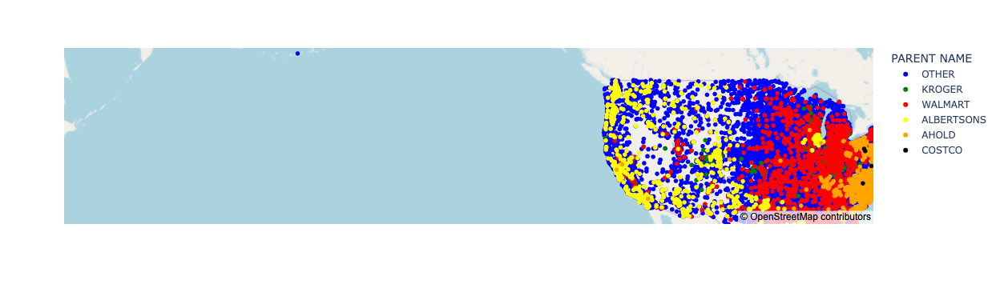

In [37]:



import plotly.express as px

#Create a scattermapbox plot
fig = px.scatter_mapbox(supermarkets_2022, lat="LATITUDE", lon="LONGITUDE", hover_data=["COMPANY"], color="PARENT NAME",
                        color_discrete_sequence=["blue", "green", "red","yellow","orange",'black'], mapbox_style="open-street-map")

fig.show()





#import plotly.express as px

# Filter the DataFrame for a specific company
#costco = "COSTCO"
#filtered_df = supermarkets_2022[supermarkets_2022["COMPANY"] == 'COSTCO']

# Create a scattermapbox plot
#fig = px.scatter_mapbox(filtered_df, lat="LATITUDE", lon="LONGITUDE", hover_data=["COMPANY"], color="PARENT NAME",
                        #color_discrete_sequence=["blue", "green", "red", "yellow", "orange"], mapbox_style="open-street-map")

#fig.show()

In [ ]:
supermarkets_2022['PARENT NAME' == ('COSTCO')].count()

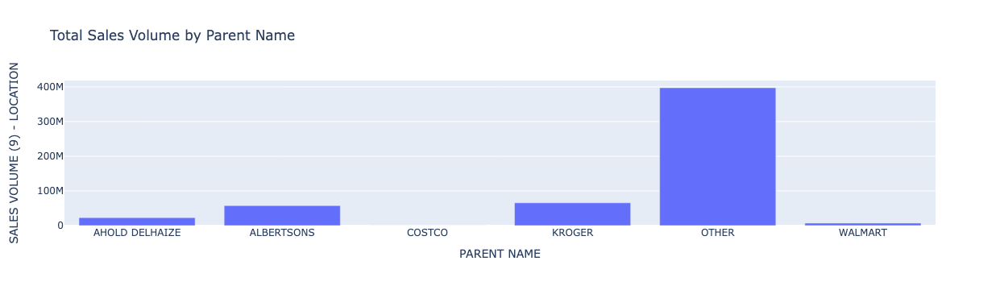

In [27]:
#x_column = "PARENT NAME"  
#y_column = "SALES VOLUME (9) - LOCATION"  


#fig = px.bar(supermarkets_2022, x=x_column, y=y_column)


#fig.show()

## *question* since we cleaned our data, then costco only seems to have very few data and 
#                      that affects our comparision to other parent companies 


# tips - normalize the dataset, 

# - try using parent actual sales volume instead

#bar graph: sum of sales volume per location 
x_column = "PARENT NAME"
y_column = "SALES VOLUME (9) - LOCATION"

grouped_df = supermarkets_2022.groupby(x_column)[y_column].sum().reset_index()

fig = px.bar(grouped_df, x=x_column, y=y_column, title="Total Sales Volume by Parent Name")

fig.show()

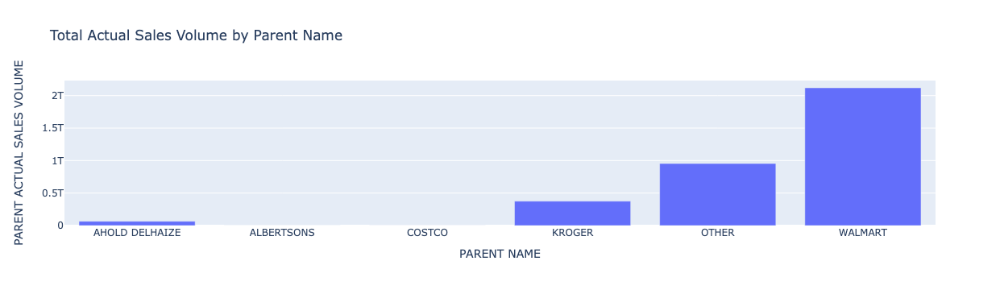

In [28]:
# bar graph: sum of parent actual sales volume 


x_column = "PARENT NAME"
y_column = "PARENT ACTUAL SALES VOLUME"

grouped_df = supermarkets_2022.groupby(x_column)[y_column].sum().reset_index()

fig = px.bar(grouped_df, x=x_column, y=y_column, title="Total Actual Sales Volume by Parent Name")

fig.show()

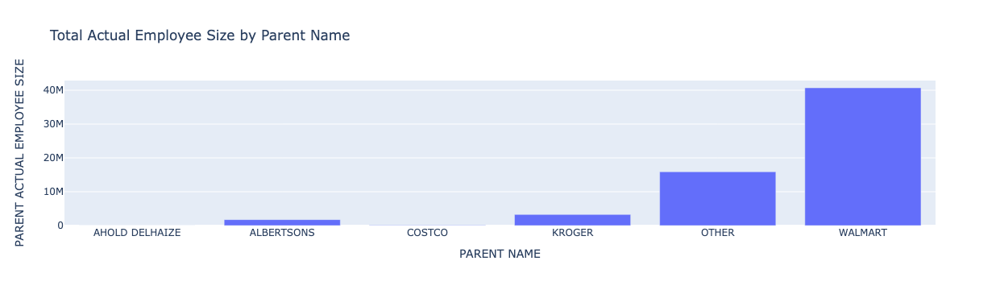

In [29]:
# bar graph: sum of parent actual employee size

x_column = "PARENT NAME"
y_column = "PARENT ACTUAL EMPLOYEE SIZE"

grouped_df = supermarkets_2022.groupby(x_column)[y_column].sum().reset_index()

fig = px.bar(grouped_df, x=x_column, y=y_column, title="Total Actual Employee Size by Parent Name")

fig.show()

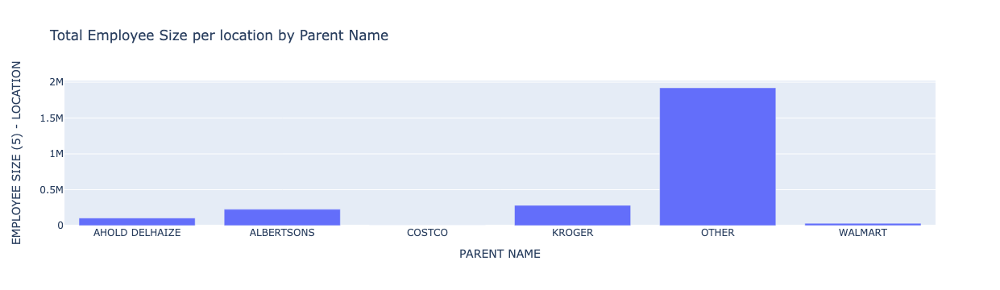

In [30]:
# bar graph: sum of parent actual employee size per location


x_column = "PARENT NAME"
y_column = "EMPLOYEE SIZE (5) - LOCATION"

grouped_df = supermarkets_2022.groupby(x_column)[y_column].sum().reset_index()

fig = px.bar(grouped_df, x=x_column, y=y_column, title="Total Employee Size per location by Parent Name")

fig.show()

In [10]:
supermarkets_2022.head()


# Assume you have a DataFrame or Series named new_column_data with values to be added
parentcomp_column = pd.Series(['219.18 ', '148.3 ','222.7 ','91.64', '77.65'], name="Total Company Sales 2022(In Billions)")

# Create a dictionary mapping parent names to corresponding new column values
mapping_dict = {"WALMART": 219.18, "KROGER": 148.3,"COSTCO": 222.7, "AHOLD": 91.64, 'ALBERTSONS': 77}

# Add the new column based on the mapping
supermarkets_2022["Total Company Sales 2022(In Billions)"] = supermarkets_2022["PARENT NAME"].map(mapping_dict)

# Display the updated supermarkets_2022 DataFrame
supermarkets_2022

/tmp/ipykernel_1502604/3303913288.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  supermarkets_2022["Total Company Sales 2022(In Billions)"] = supermarkets_2022["PARENT NAME"].map(mapping_dict)


,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,LOCATION SALES VOLUME CODE,PRIMARY SIC CODE,SIC6_DESCRIPTIONS,PRIMARY NAICS CODE,NAICS8 DESCRIPTIONS,SIC CODE,SIC6_DESCRIPTIONS (SIC),SIC CODE 1,SIC6_DESCRIPTIONS (SIC1),SIC CODE 2,SIC6_DESCRIPTIONS(SIC2),SIC CODE 3,SIC6_DESCRIPTIONS(SIC3),SIC CODE 4,SIC6_DESCRIPTIONS(SIC4),ARCHIVE VERSION YEAR,YELLOW PAGE CODE,EMPLOYEE SIZE (5) - LOCATION,SALES VOLUME (9) - LOCATION,BUSINESS STATUS CODE,INDUSTRY SPECIFIC FIRST BYTE,YEAR ESTABLISHED,OFFICE SIZE CODE,COMPANY HOLDING STATUS,ABI,SUBSIDIARY NUMBER,PARENT NUMBER,PARENT ACTUAL EMPLOYEE SIZE,PARENT ACTUAL SALES VOLUME,PARENT EMPLOYEE SIZE CODE,PARENT SALES VOLUME CODE,SITE NUMBER,ADDRESS TYPE INDICATOR,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE,PARENT NAME,Total Company Sales 2022(In Billions)
2,EL SOL MARKET,110 W MAIN ST,WESTMORLAND,CA,92281,NaN,25.0,760,2,B,C,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,5.0,1061.0,9,NaN,NaN,NaN,NaN,519605455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,10200.0,1.0,33.051800,-115.581800,X,20940.0,2.0,0.0,6025.0,OTHER,NaN
3,COOL SPRINGS GROCERY,241 WILDWOOD ST,MORGANTOWN,WV,26505,3141.0,61.0,304,2,A,A,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,2.0,382.0,9,NaN,NaN,NaN,NaN,817953730,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,10400.0,4.0,39.652885,-79.986398,P,34060.0,2.0,390.0,54061.0,OTHER,NaN
5,EL SOL MEAT MARKET,1100 MEADOWS RD # B,CALEXICO,CA,92231,5917.0,25.0,760,2,D,E,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,542107.0,MEAT-RETAIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,NaN,29.0,6153.0,9,NaN,NaN,NaN,NaN,995912391,NaN,NaN,NaN,NaN,NaN,NaN,995912391.0,NaN,7,12002.0,2.0,32.679923,-115.482166,P,20940.0,2.0,0.0,6025.0,OTHER,NaN
7,KROGER,1600 S OHIO ST,MARTINSVILLE,IN,46151,3317.0,109.0,765,2,F,G,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,102.0,21931.0,2,P,NaN,NaN,NaN,140765967,NaN,7521503.0,1200.0,137888000.0,I,I,140765967.0,NaN,7,510701.0,2.0,39.411880,-86.425148,P,26900.0,2.0,294.0,18109.0,KROGER,148.3
8,FOOD 4 LESS,2420 COTTONWOOD DR,EL CENTRO,CA,92243,1604.0,25.0,760,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,70.0,14851.0,2,ï¿½,NaN,NaN,NaN,215261702,402627138.0,7521503.0,1200.0,137888000.0,I,I,215261702.0,NaN,7,11201.0,1.0,32.815719,-115.572166,P,20940.0,2.0,0.0,6025.0,KROGER,148.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203492,WRAY'S MARKETFRESH IGA,401 W NOB HILL BLVD,YAKIMA,WA,98902,4634.0,77.0,509,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,50.0,12261.0,2,L,NaN,NaN,NaN,175369438,NaN,175380120.0,150.0,48500.0,F,G,NaN,NaN,7,700.0,3.0,46.585786,-120.510380,P,49420.0,2.0,0.0,53077.0,OTHER,NaN
203493,SAFEWAY,2204 W NOB HILL BLVD # A,YAKIMA,WA,98902,6200.0,77.0,509,2,F,G,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,546102.0,BAKERS-RETAIL,599201.0,FLORISTS-RETAIL,592102.0,LIQUORS-RETAIL,NaN,NaN,NaN,NaN,2022,NaN,145.0,35556.0,2,V,NaN,NaN,NaN,840802979,9606492.0,5995907.0,800.0,NaN,H,NaN,840802979.0,NaN,7,1100.0,1.0,46.584035,-120.539230,P,49420.0,2.0,0.0,53077.0,ALBERTSONS,77.0
203497,T-MART,103 SUNRISE DR,SUNRISE BEACH,TX,78643,9287.0,299.0,325,2,A,A,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,343201.0,PLUMBING FIXTURES & SUPPLIES-MFRS,572222

<function matplotlib.pyplot.show(close=None, block=None)>

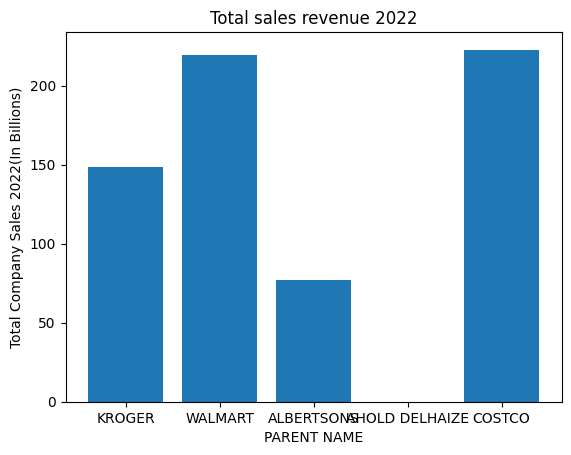

In [13]:
x =supermarkets_2022['PARENT NAME']
y = supermarkets_2022['Total Company Sales 2022(In Billions)']

plt.bar(x, y)
plt.xlabel('PARENT NAME')
plt.ylabel('Total Company Sales 2022(In Billions)')
plt.title ( 'Total sales revenue 2022')
plt.show

In [11]:
def true_sales(row):
    '''Creates a new column called "PARENT NAME" based on the cleaned string match list''' 
    '''The new column generalizes individual companies into their parent coporation (ie. Walmart, Krogers, etc.)''' 
    companies = row['PARENT NAME']  
    
    if companies == "WALMART":
        return 218.944
    if companies == "COSTCO":
        return 85.6
    if companies == "ALBERTSONS":
        return 77.6497
    if companies == "KROGER":
        return 148.3
    if companies == "AHOLD DELHAIZE":
        return .060464538
    if companies == "OTHER":
        return 641.535248

supermarkets_2022['PARENT TRUE SALES (BILLIONS)'] = supermarkets_2022.apply(true_sales, axis=1)

/tmp/ipykernel_1502604/3010909825.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  supermarkets_2022['PARENT TRUE SALES (BILLIONS)'] = supermarkets_2022.apply(true_sales, axis=1)


In [16]:
supermarkets_2022.tail()

,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,LOCATION SALES VOLUME CODE,PRIMARY SIC CODE,SIC6_DESCRIPTIONS,PRIMARY NAICS CODE,NAICS8 DESCRIPTIONS,SIC CODE,SIC6_DESCRIPTIONS (SIC),SIC CODE 1,SIC6_DESCRIPTIONS (SIC1),SIC CODE 2,SIC6_DESCRIPTIONS(SIC2),SIC CODE 3,SIC6_DESCRIPTIONS(SIC3),SIC CODE 4,SIC6_DESCRIPTIONS(SIC4),ARCHIVE VERSION YEAR,YELLOW PAGE CODE,EMPLOYEE SIZE (5) - LOCATION,SALES VOLUME (9) - LOCATION,BUSINESS STATUS CODE,INDUSTRY SPECIFIC FIRST BYTE,YEAR ESTABLISHED,OFFICE SIZE CODE,COMPANY HOLDING STATUS,ABI,SUBSIDIARY NUMBER,PARENT NUMBER,PARENT ACTUAL EMPLOYEE SIZE,PARENT ACTUAL SALES VOLUME,PARENT EMPLOYEE SIZE CODE,PARENT SALES VOLUME CODE,SITE NUMBER,ADDRESS TYPE INDICATOR,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE,PARENT NAME,Total Company Sales 2022(In Billions),PARENT TRUE SALES (BILLIONS)
203492,WRAY'S MARKETFRESH IGA,401 W NOB HILL BLVD,YAKIMA,WA,98902,4634.0,77.0,509,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,50.0,12261.0,2,L,NaN,NaN,NaN,175369438,NaN,175380120.0,150.0,48500.0,F,G,NaN,NaN,7,700.0,3.0,46.585786,-120.510380,P,49420.0,2.0,0.0,53077.0,OTHER,NaN,641.535248
203493,SAFEWAY,2204 W NOB HILL BLVD # A,YAKIMA,WA,98902,6200.0,77.0,509,2,F,G,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,546102.0,BAKERS-RETAIL,599201.0,FLORISTS-RETAIL,592102.0,LIQUORS-RETAIL,NaN,NaN,NaN,NaN,2022,NaN,145.0,35556.0,2,V,NaN,NaN,NaN,840802979,9606492.0,5995907.0,800.0,NaN,H,NaN,840802979.0,NaN,7,1100.0,1.0,46.584035,-120.539230,P,49420.0,2.0,0.0,53077.0,ALBERTSONS,77.0,77.649700
203497,T-MART,103 SUNRISE DR,SUNRISE BEACH,TX,78643,9287.0,299.0,325,2,A,A,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,343201.0,PLUMBING FIXTURES & SUPPLIES-MFRS,572222.0,PUMPS-RETAIL,508444.0,PUMPS (WHLS),525104.0,HARDWARE-RETAIL,594131.0,FISHING TACKLE-DEALERS,2022,NaN,2.0,441.0,9,NaN,NaN,NaN,NaN,880617683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,970300.0,1.0,30.593381,-98.425843,P,0.0,NaN,0.0,48299.0,OTHER,NaN,641.535248
203498,H-E-B,1434 W WELLS BRANCH PKWY,PFLUGERVILLE,TX,78660,3153.0,453.0,512,2,G,H,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,554101.0,SERVICE STATIONS-GASOLINE & OIL,729954.0,VEHICLE & DRIVERS LICENSING SERVICES,581208.0,RESTAURANTS,NaN,NaN,NaN,NaN,2022,39106.0,270.0,71857.0,2,F,NaN,NaN,NaN,403451198,NaN,436443592.0,1000.0,23000000.0,I,K,403451198.0,NaN,8,1840.0,3.0,30.442331,-97.664580,P,12420.0,2.0,0.0,48453.0,OTHER,NaN,641.535248
203501,PRICE CHOPPER,1 KENDALL WAY,BALLSTON SPA,NY,12020,4399.0,91.0,518,2,F,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,543101.0,FRUITS & VEGETABLES & PRODUCE-RETAIL,546103.0,BAKERS-CAKE & PIE,NaN,NaN,NaN,NaN,NaN,NaN,2022,NaN,100.0,18804.0,2,U,NaN,NaN,NaN,734631888,4352464.0,769874507.0,NaN,NaN,NaN,NaN,734631888.0,NaN,7,61901.0,5.0,42.973191,-73.794719,P,10580.0,2.0,104.0,36091.0,OTHER,NaN,641.535248


<function matplotlib.pyplot.show(close=None, block=None)>

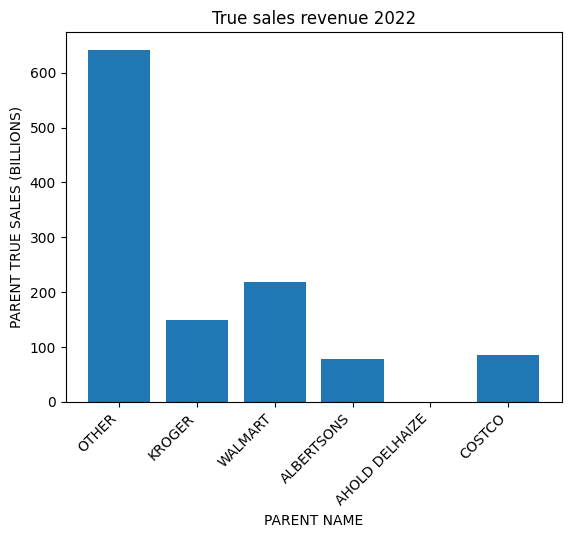

In [18]:
x =supermarkets_2022['PARENT NAME']
y = supermarkets_2022['PARENT TRUE SALES (BILLIONS)']

plt.bar(x, y)
plt.xlabel('PARENT NAME')
plt.ylabel('PARENT TRUE SALES (BILLIONS)')
plt.title ( 'True sales revenue 2022')
plt.xticks(rotation = 45, ha='right')
plt.show

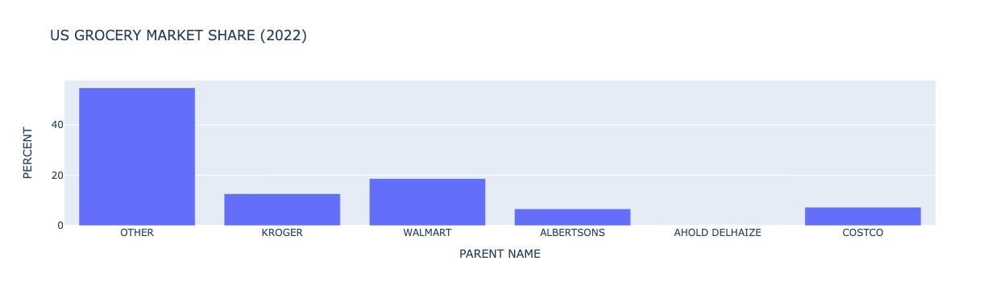

In [19]:
market_share = supermarkets_2022.iloc[:,[-2,-1]]
market_share = market_share.drop_duplicates().reset_index().drop(columns="index").rename(columns={"PARENT TRUE SALES (BILLIONS)":"SALES (BILLIONS)"})
market_share["PERCENT"] = (market_share["SALES (BILLIONS)"] / market_share["SALES (BILLIONS)"].sum()) * 100
market_share

fig = px.bar(market_share, x='PARENT NAME', y='PERCENT',title="US GROCERY MARKET SHARE (2022)")
fig.show()

## task 1: using dask and finding missing data 

In [ ]:
# missing / misrepresented stores in 2022 data: 
# costco = 29 stores  
# va-9,pa-6,nj-5,ny-4,md-2,nc-1,ct-1,nh-1

# ALBERTSONS = 2191
# KROGER = 2716
# OTHER = 68326
# WALMART = 3702 
#alhold = 1485

In [42]:
costco_trial = supermarkets_2022[supermarkets_2022['PARENT NAME'] == 'AHOLD DELHAIZE']
costcos_by_state = costco_trial['STATE'].value_counts()
costcos_by_state
supermarkets_2022.

STATE
NC    508
VA    339
SC    165
MD    150
ME     69
NY     55
GA     46
NH     37
TN     28
DE     26
VT     17
MA     17
WV     14
DC      7
PA      3
KY      3
RI      1
Name: count, dtype: int64

In [17]:
supermarkets_2022['GEOMETRY'] = supermarkets_2022.apply(lambda row: {"type": "Point", "coordinates": [row['LONGITUDE'], row['LATITUDE']]}, axis=1)
supermarkets_2022.head()

/tmp/ipykernel_1502604/678613924.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,LOCATION SALES VOLUME CODE,PRIMARY SIC CODE,SIC6_DESCRIPTIONS,PRIMARY NAICS CODE,NAICS8 DESCRIPTIONS,SIC CODE,SIC6_DESCRIPTIONS (SIC),SIC CODE 1,SIC6_DESCRIPTIONS (SIC1),SIC CODE 2,SIC6_DESCRIPTIONS(SIC2),SIC CODE 3,SIC6_DESCRIPTIONS(SIC3),SIC CODE 4,SIC6_DESCRIPTIONS(SIC4),ARCHIVE VERSION YEAR,YELLOW PAGE CODE,EMPLOYEE SIZE (5) - LOCATION,SALES VOLUME (9) - LOCATION,BUSINESS STATUS CODE,INDUSTRY SPECIFIC FIRST BYTE,YEAR ESTABLISHED,OFFICE SIZE CODE,COMPANY HOLDING STATUS,ABI,SUBSIDIARY NUMBER,PARENT NUMBER,PARENT ACTUAL EMPLOYEE SIZE,PARENT ACTUAL SALES VOLUME,PARENT EMPLOYEE SIZE CODE,PARENT SALES VOLUME CODE,SITE NUMBER,ADDRESS TYPE INDICATOR,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE,PARENT NAME,Total Company Sales 2022(In Billions),PARENT TRUE SALES (BILLIONS),geometry,GEOMETRY
2,EL SOL MARKET,110 W MAIN ST,WESTMORLAND,CA,92281,NaN,25.0,760,2,B,C,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,5.0,1061.0,9,NaN,NaN,NaN,NaN,519605455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,10200.0,1.0,33.051800,-115.581800,X,20940.0,2.0,0.0,6025.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-115.5818, 3...","{'type': 'Point', 'coordinates': [-115.5818, 3..."
3,COOL SPRINGS GROCERY,241 WILDWOOD ST,MORGANTOWN,WV,26505,3141.0,61.0,304,2,A,A,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,2.0,382.0,9,NaN,NaN,NaN,NaN,817953730,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,10400.0,4.0,39.652885,-79.986398,P,34060.0,2.0,390.0,54061.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-79.986398, ...","{'type': 'Point', 'coordinates': [-79.986398, ..."
5,EL SOL MEAT MARKET,1100 MEADOWS RD # B,CALEXICO,CA,92231,5917.0,25.0,760,2,D,E,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,542107.0,MEAT-RETAIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,NaN,29.0,6153.0,9,NaN,NaN,NaN,NaN,995912391,NaN,NaN,NaN,NaN,NaN,NaN,995912391.0,NaN,7,12002.0,2.0,32.679923,-115.482166,P,20940.0,2.0,0.0,6025.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-115.482166,...","{'type': 'Point', 'coordinates': [-115.482166,..."
7,KROGER,1600 S OHIO ST,MARTINSVILLE,IN,46151,3317.0,109.0,765,2,F,G,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,102.0,21931.0,2,P,NaN,NaN,NaN,140765967,NaN,7521503.0,1200.0,137888000.0,I,I,140765967.0,NaN,7,510701.0,2.0,39.411880,-86.425148,P,26900.0,2.0,294.0,18109.0,KROGER,148.3,148.300000,"{'type': 'Point', 'coordinates': [-86.425148, ...","{'type': 'Point', 'coordinates': [-86.425148, ..."
8,FOOD 4 LESS,2420 COTTONWOOD DR,EL CENTRO,CA,92243,1604.0,25.0,760,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,70.0,14851.0,2,ï¿½,NaN,NaN,NaN,215261702,402627138.0,7521503.0,1200.0,137888000.0,I,I,215261702.0,NaN,7,11201.0,1.0,32.815719,-115.572166,P,20940.0,2.0,0.0,6025.0,KROGER,148.3,148.300000,"{'type': 'Point', 'coordinates': [-115.572166,...","{'type': 'Point', 'coordinates': [-115.572166,..."


In [19]:
ill_supermarkets = supermarkets_2022.query("STATE == 'IL'")
ill_supermarkets.head()

,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,LOCATION SALES VOLUME CODE,PRIMARY SIC CODE,SIC6_DESCRIPTIONS,PRIMARY NAICS CODE,NAICS8 DESCRIPTIONS,SIC CODE,SIC6_DESCRIPTIONS (SIC),SIC CODE 1,SIC6_DESCRIPTIONS (SIC1),SIC CODE 2,SIC6_DESCRIPTIONS(SIC2),SIC CODE 3,SIC6_DESCRIPTIONS(SIC3),SIC CODE 4,SIC6_DESCRIPTIONS(SIC4),ARCHIVE VERSION YEAR,YELLOW PAGE CODE,EMPLOYEE SIZE (5) - LOCATION,SALES VOLUME (9) - LOCATION,BUSINESS STATUS CODE,INDUSTRY SPECIFIC FIRST BYTE,YEAR ESTABLISHED,OFFICE SIZE CODE,COMPANY HOLDING STATUS,ABI,SUBSIDIARY NUMBER,PARENT NUMBER,PARENT ACTUAL EMPLOYEE SIZE,PARENT ACTUAL SALES VOLUME,PARENT EMPLOYEE SIZE CODE,PARENT SALES VOLUME CODE,SITE NUMBER,ADDRESS TYPE INDICATOR,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE,PARENT NAME,Total Company Sales 2022(In Billions),PARENT TRUE SALES (BILLIONS),geometry,GEOMETRY
13,KROGER,301 E MCKINLEY RD,OTTAWA,IL,61350,4805.0,99.0,815,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,70.0,14158.0,2,P,NaN,NaN,NaN,152123287,NaN,7521503.0,1200.0,137888000.0,I,I,152123287.0,NaN,7,963500.0,1.0,41.323858,-88.836271,P,36837.0,1.0,176.0,17099.0,KROGER,148.3,148.300000,"{'type': 'Point', 'coordinates': [-88.836271, ...","{'type': 'Point', 'coordinates': [-88.836271, ..."
199,SPRING VALLEY SUPERMARKET,117 S SPALDING ST,SPRING VALLEY,IL,61362,2097.0,11.0,815,2,E,E,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,542107.0,MEAT-RETAIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,60.0,8908.0,9,NaN,NaN,NaN,NaN,2994101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,965200.0,2.0,41.323951,-89.199282,P,36837.0,1.0,176.0,17011.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-89.199282, ...","{'type': 'Point', 'coordinates': [-89.199282, ..."
316,SENECA FOOD MART,271 S MAIN ST,SENECA,IL,61360,9415.0,99.0,815,2,B,C,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,209903.0,FOOD PRODUCTS & MANUFACTURERS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,8.0,1618.0,2,NaN,NaN,NaN,NaN,152142808,NaN,558247.0,75.0,1385280.0,E,K,NaN,NaN,4,963700.0,1.0,41.306622,-88.610207,P,36837.0,1.0,176.0,17099.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-88.610207, ...","{'type': 'Point', 'coordinates': [-88.610207, ..."
379,HANDY FOODS,604 W MAIN ST,OTTAWA,IL,61350,2718.0,99.0,815,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,90.0,19214.0,9,L,1963.0,NaN,NaN,152124368,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,962800.0,4.0,41.346474,-88.848812,P,36837.0,1.0,176.0,17099.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-88.848812, ...","{'type': 'Point', 'coordinates': [-88.848812, ..."
435,SULLIVAN'S FOODS,1102 MERIDEN ST,MENDOTA,IL,61342,1054.0,99.0,815,2,E,F,541105,GROCERS-RETAIL,44511003.0,SUPERMARKETS/OTHER GROCERY (EXC CONVENIENCE) STRS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,39106.0,72.0,14562.0,2,NaN,1967.0,NaN,NaN,2971463,NaN,356801134.0,NaN,389500.0,NaN,I,2971463.0,NaN,5,961900.0,3.0,41.555409,-89.125462,0,36837.0,1.0,176.0,17099.0,OTHER,NaN,641.535248,"{'type': 'Point', 'coordinates': [-89.125462, ...","{'type': 'Point', 'coordinates': [-89.125462, ..."


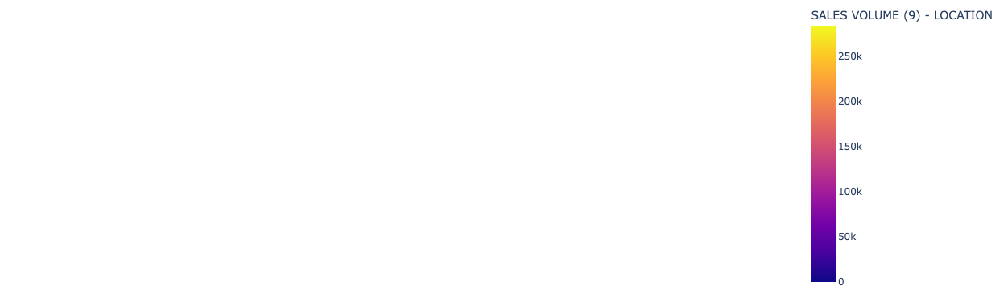

In [22]:
import plotly.express as px

fig = px.choropleth(ill_supermarkets, geojson=geojson, color="SALES VOLUME (9) - LOCATION",
                    locations="GEOMETRY", featureidkey="properties.ill_supermarket_id",
                    projection="mercator"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
